# Experiments (Visualization)

In [1]:
using CSV
using DataFrames
using Plots
using StatsBase: mean

In [2]:
function moving_average(data, window_size::Int)
    n = length(data)
    ma = zeros(n)
    for i in 1:n
        start_index = max(1, i - window_size + 1)
        ma[i] = mean(data[start_index:i])
    end
    return ma
end;

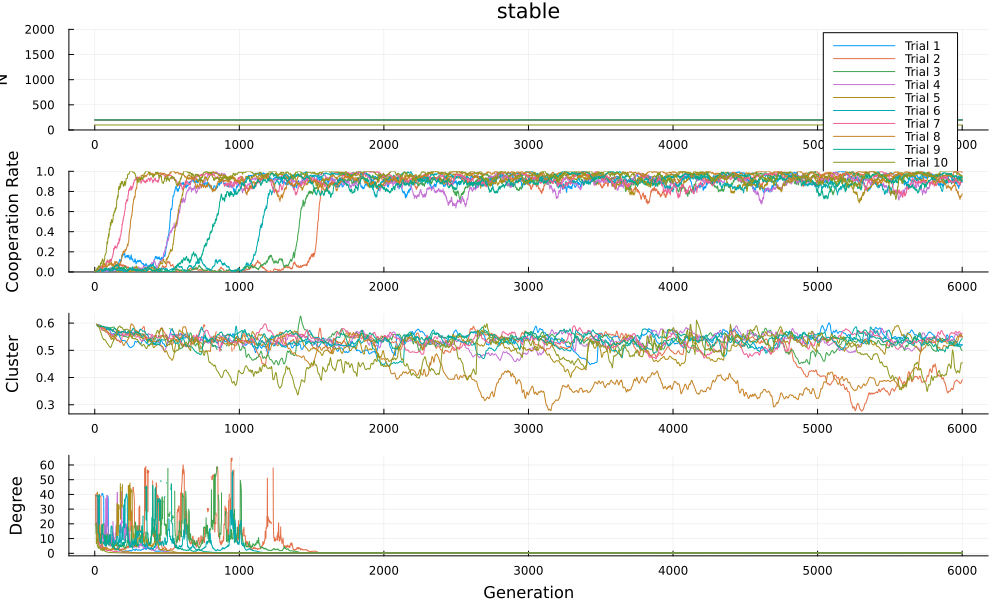

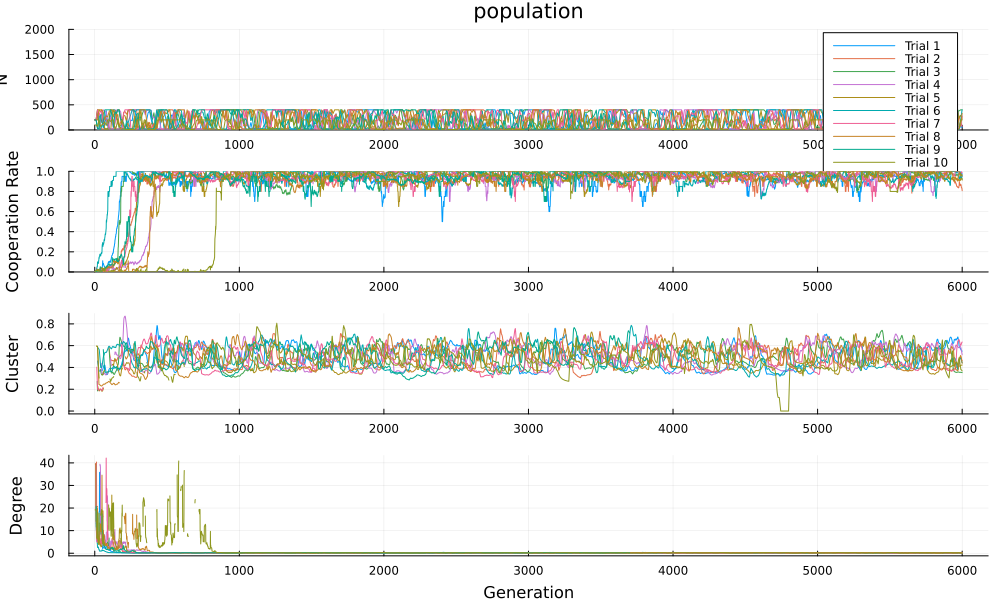

In [18]:
# for normalization_pattern in ["", "_pattern12"]
for normalization_pattern in ["_k999_τ10"]
    # for variability_mode in ["stable", "population", "payoff", "strategy", "relationship"]
    for variability_mode in ["stable", "population"]
        plot_N = plot(xlabel="", ylabel="N", label = false, ylim = (0, 2000), title = variability_mode)
        plot_c_rate = plot(xlabel="", ylabel="Cooperation Rate", label = false, ylim = (0, 1))
        plot_wcc = plot(xlabel="", ylabel="Cluster", label = false)
        plot_wk = plot(xlabel="Generation", ylabel="Degree", label = false)

        for seed in 1:10
            try
                data = CSV.read("experiments/output_$(variability_mode)_$(seed)$(normalization_pattern).csv", DataFrame)
                
                N_ma = moving_average(data.N, 10)
                wcc_C_ma = moving_average(data.wcc_C_mean, 10)
                wcc_CD_ma = moving_average(data.wcc_CD_mean, 10)
                
                plot!(plot_N, data.generation, N_ma, label = "Trial $(seed)")
                # plot!(plot_N, data.generation, data.N, label = "Trial $(seed)")
                plot!(plot_c_rate, data.generation, data.cooperation_rate, label = false)
                plot!(plot_wcc, data.generation, wcc_C_ma, label = false)
                # plot!(plot_wcc, data.generation, wcc_CD_ma, label = false)
                # plot!(plot_wcc, data.generation, data.weighted_clustering_coefficient, label = false)
                plot!(plot_wk, data.generation, data.wk_C_mean ./ data.cooperation_rate ./ data.N, label = false)
                # plot!(plot_wk, data.generation, data.wk_CD_mean ./ data.N, label = false)
            catch e
                println(e)
            end
        end

        display(plot(plot_N, plot_c_rate, plot_wcc, plot_wk, layout = (4, 1), size = (1000, 600)))
    end
end

In [4]:
# for seed in 1:10
#     # for normalization_pattern in ["", "_pattern12"]
#     for normalization_pattern in ["_pattern12"]
#         for variability_mode in ["stable", "population", "payoff"]
#             plot_N = plot(xlabel="", ylabel="N", label = false, ylim = (0, 2000), title = variability_mode)
#             plot_c_rate = plot(xlabel="", ylabel="Cooperation Rate", label = false, ylim = (0, 1))
#             plot_wcc = plot(xlabel="", ylabel="Cluster", label = false)
#             plot_wk = plot(xlabel="Generation", ylabel="Degree", label = false)

#             try
#                 data = CSV.read("experiments/output_$(variability_mode)_$(seed)$(normalization_pattern).csv", DataFrame)
                
#                 N_ma = moving_average(data.N, 100)
#                 wcc_ma = moving_average(data.weighted_clustering_coefficient, 100)
                
#                 plot!(plot_N, data.generation, N_ma, label = "Trial $(seed)")
#                 plot!(plot_c_rate, data.generation, data.cooperation_rate, label = false)
#                 plot!(plot_wcc, data.generation, wcc_ma, label = false)
#                 plot!(plot_wk, data.generation, data.weighted_degree, label = false)
#             catch e
#                 println(e)
#             end

#             display(plot(plot_N, plot_c_rate, plot_wcc, plot_wk, layout = (4, 1), size = (1000, 600)))
#         end
#     end
# end